# **Project Name**    - Netflix EDA

##### **Project Type**    - EDA
##### **Contribution**    - Individual
##### **Name -** K. Abhinay


# **Problem Statement**


**As the streaming market expanded rapidly, companies such as Netflix have developed their content strategies across time. Starting from 2010, Netflix has greatly expanded its library of TV shows as it cut down on its movies. Few publicly available insights are, however, available about the nature, distribution, and evolution of such content country-wise. Additionally, it is also a challenge to comprehend how content categories are interlinked and what category of content can be accessed from where. More analysis is needed to dig up trends, local patterns, and commonalities among the library of Netflix's content.**

#### **Define Your Business Objective?**

The objective of this project is to perform exploratory data analysis on Netflix's 2019 content:

**1. Analyze and visualize the overall distribution of content (TV shows vs. movies) over time.**\
**2. Identify Netflix’s focus shift toward TV content in recent years.**\
**3. Examine the diversity of content types across different countries.**

# ***Let's Begin !***

## ***1. Know Your Data***

### Import Libraries

In [1]:
# Import Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter
from sklearn.preprocessing import LabelEncoder

### Dataset Loading

In [2]:
# Load Dataset
df=pd.read_csv('NETFLIX MOVIES AND TV SHOWS CLUSTERING.csv')

### Dataset First View

In [3]:
# Dataset First Look4
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...


### Dataset Rows & Columns count

In [4]:
# Dataset Rows & Columns count
df.shape

(7787, 12)

### Dataset Information

In [5]:
# Dataset Info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7787 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7787 non-null   object
 1   type          7787 non-null   object
 2   title         7787 non-null   object
 3   director      5398 non-null   object
 4   cast          7069 non-null   object
 5   country       7280 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7787 non-null   int64 
 8   rating        7780 non-null   object
 9   duration      7787 non-null   object
 10  listed_in     7787 non-null   object
 11  description   7787 non-null   object
dtypes: int64(1), object(11)
memory usage: 730.2+ KB


#### Duplicate Values

In [6]:
# Dataset Duplicate Value Count
df.duplicated().sum()

0

#### Missing Values/Null Values

In [7]:
# Missing Values/Null Values Count
df.isna().sum().sort_values(ascending=False)

director        2389
cast             718
country          507
date_added        10
rating             7
show_id            0
type               0
title              0
release_year       0
duration           0
listed_in          0
description        0
dtype: int64

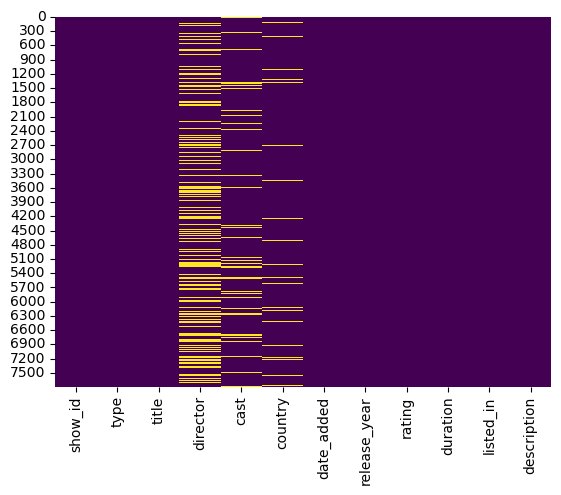

In [8]:
# Visualizing the missing values
sns.heatmap(df.isna(),cmap="viridis",cbar=False)
plt.show()

### What did you know about your dataset?

This dataset contains columns like 'show_id', 'type', 'title', 'director','cast', 'country', 
'date_added','release_year', 'rating', 'duration', 'listed_in', 'description' with 7787 rows.

Null values are found in director, cast and country columns that must be handled.

## ***2. Understanding Your Variables***

In [9]:
# Dataset Columns
df.columns

Index(['show_id', 'type', 'title', 'director', 'cast', 'country', 'date_added',
       'release_year', 'rating', 'duration', 'listed_in', 'description'],
      dtype='object')

In [10]:
# Dataset Describe
df.describe()

,release_year
count,7787.000000
mean,2013.932580
std,8.757395
min,1925.000000
25%,2013.000000
50%,2017.000000
75%,2018.000000
max,2021.000000


### Variables Description

Except release_year column are are text based columns, hence there are no statistical descriptive analysis on that columns.

### Check Unique Values for each variable.

In [11]:
# Check Unique Values for each variable.
for x in df.columns:
    print(x," ",df[x].nunique())

show_id   7787
type   2
title   7787
director   4049
cast   6831
country   681
date_added   1565
release_year   73
rating   14
duration   216
listed_in   492
description   7769


In [12]:
for x in df.columns:
    print(x," ",df[x].unique())

show_id   ['s1' 's2' 's3' ... 's7785' 's7786' 's7787']
type   ['TV Show' 'Movie']
title   ['3%' '7:19' '23:59' ... 'Zulu Man in Japan' "Zumbo's Just Desserts"
 "ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS"]
director   [nan 'Jorge Michel Grau' 'Gilbert Chan' ... 'Josef Fares' 'Mozez Singh'
 'Sam Dunn']
cast   ['João Miguel, Bianca Comparato, Michel Gomes, Rodolfo Valente, Vaneza Oliveira, Rafael Lozano, Viviane Porto, Mel Fronckowiak, Sergio Mamberti, Zezé Motta, Celso Frateschi'
 'Demián Bichir, Héctor Bonilla, Oscar Serrano, Azalia Ortiz, Octavio Michel, Carmen Beato'
 'Tedd Chan, Stella Chung, Henley Hii, Lawrence Koh, Tommy Kuan, Josh Lai, Mark Lee, Susan Leong, Benjamin Lim'
 ...
 'Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanana, Manish Chaudhary, Meghna Malik, Malkeet Rauni, Anita Shabdish, Chittaranjan Tripathy'
 'Nasty C' 'Adriano Zumbo, Rachel Khoo']
country   ['Brazil' 'Mexico' 'Singapore' 'United States' 'Turkey' 'Egypt' 'India'
 'Poland, United States' 'Thailand' 'Nigeria' nan
 

## 3. ***Data Wrangling***

### Data Wrangling Code

In [13]:
# Write your code to make your dataset analysis ready.
df['rating'].mode()[0]

'TV-MA'

In [14]:
df['rating'].isna().sum()

7

In [15]:
# Handling null values in 'rating' columns by filling with mode.
df['rating']=df['rating'].fillna(df['rating'].mode()[0])

In [16]:
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...


In [17]:
# Function to extract Month from 'date_added' columns for month-wise analysis.
def month(y):
    try:
        for x in y:
            if x.isdigit():
                y=y.replace(x,"")
        y=y.replace(",","").rstrip()
        return y.strip() 
    except TypeError:
        return np.nan

In [18]:
df['month']=df['date_added'].apply(month)
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,month
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...,August
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...,December
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow...",December
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi...",November
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...,January


In [19]:
df[df['month'].isna()]

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,month
258,s259,TV Show,A Young Doctor's Notebook and Other Stories,NaN,"Daniel Radcliffe, Jon Hamm, Adam Godley, Chris...",United Kingdom,NaN,2013,TV-MA,2 Seasons,"British TV Shows, TV Comedies, TV Dramas","Set during the Russian Revolution, this comic ...",NaN
549,s550,TV Show,Anthony Bourdain: Parts Unknown,NaN,Anthony Bourdain,United States,NaN,2018,TV-PG,5 Seasons,Docuseries,This CNN original series has chef Anthony Bour...,NaN
2263,s2264,TV Show,Frasier,NaN,"Kelsey Grammer, Jane Leeves, David Hyde Pierce...",United States,NaN,2003,TV-PG,11 Seasons,"Classic & Cult TV, TV Comedies",Frasier Crane is a snooty but lovable Seattle ...,NaN
2288,s2289,TV Show,Friends,NaN,"Jennifer Aniston, Courteney Cox, Lisa Kudrow, ...",United States,NaN,2003,TV-14,10 Seasons,"Classic & Cult TV, TV Comedies",This hit sitcom follows the merry misadventure...,NaN
2555,s2556,TV Show,Gunslinger Girl,NaN,"Yuuka Nanri, Kanako Mitsuhashi, Eri Sendai, Am...",Japan,NaN,2008,TV-14,2 Seasons,"Anime Series, Crime TV Shows","On the surface, the Social Welfare Agency appe...",NaN
3374,s3375,TV Show,Kikoriki,NaN,Igor Dmitriev,NaN,NaN,2010,TV-Y,2 Seasons,Kids' TV,A wacky rabbit and his gang of animal pals hav...,NaN
3492,s3493,TV Show,La Familia P. Luche,NaN,"Eugenio Derbez, Consuelo Duval, Luis Manuel Áv...",United States,NaN,2012,TV-14,3 Seasons,"International TV Shows, Spanish-Language TV Sh...","This irreverent sitcom featues Ludovico, Feder...",NaN
3946,s3947,TV Show,Maron,NaN,"Marc Maron, Judd Hirsch, Josh Brener, Nora Zeh...",United States,NaN,2016,TV-MA,4 Seasons,TV Comedies,"Marc Maron stars as Marc Maron, who interviews...",NaN
5137,s5138,TV Show,Red vs. Blue,NaN,"Burnie Burns, Jason Saldaña, Gustavo Sorola, G...",United States,NaN,2015,NR,13 Seasons,"TV Action & Adventure, TV Comedies, TV Sci-Fi ...","This parody of first-person shooter games, mil...",NaN
6065,s6066,TV Show,The Adventures of Figaro Pho,NaN,"Luke Jurevicius, Craig Behenna, Charlotte Haml...",Australia,NaN,2015,TV-Y7,2 Seasons,"Kids' TV, TV Comedies","Imagine your worst fears, then multiply them: ...",NaN


In [20]:
# Handling null values in 'month' column by filling with mode
df['month']=df.groupby("release_year")['month'].transform(lambda x: x.fillna(x.mode()[0] if not x.empty else x))

In [21]:
df[df['month'].isna()]

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description,month


In [22]:
# Dropping unnecessary columns.
df.drop(['date_added','description','show_id'],axis='columns',inplace=True)

In [23]:
df.isna().sum()

type               0
title              0
director        2389
cast             718
country          507
release_year       0
rating             0
duration           0
listed_in          0
month              0
dtype: int64

In [24]:
#Handling null values in director columns by filling with mode
df['director']=df.groupby("rating")['director'].transform(lambda x:x.fillna(x.mode()[0] if not x.empty else x))

In [25]:
df.dropna(subset="cast",inplace=True)

In [26]:
df.isna().sum()

type              0
title             0
director          0
cast              0
country         411
release_year      0
rating            0
duration          0
listed_in         0
month             0
dtype: int64

In [27]:
df.shape

(7069, 10)

In [28]:
#Dropping null values in 'country' 
df.dropna(inplace=True)

In [29]:
df.head()

,type,title,director,cast,country,release_year,rating,duration,listed_in,month
0,TV Show,3%,"Raúl Campos, Jan Suter","João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",August
1,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016,TV-MA,93 min,"Dramas, International Movies",December
2,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2011,R,78 min,"Horror Movies, International Movies",December
3,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...",November
4,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2008,PG-13,123 min,Dramas,January


In [30]:
# Creating seperate dataframes for Movies and TV Shows for analysis.
tv_shows=df[df['type']=="TV Show"]
movies=df[df['type']=='Movie']

In [31]:
tv_shows

,type,title,director,cast,country,release_year,rating,duration,listed_in,month
0,TV Show,3%,"Raúl Campos, Jan Suter","João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",August
5,TV Show,46,Serdar Akar,"Erdal Beşikçioğlu, Yasemin Allen, Melis Birkan...",Turkey,2016,TV-MA,1 Season,"International TV Shows, TV Dramas, TV Mysteries",July
11,TV Show,1983,"Raúl Campos, Jan Suter","Robert Więckiewicz, Maciej Musiał, Michalina O...","Poland, United States",2018,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Dramas",November
24,TV Show,​SAINT SEIYA: Knights of the Zodiac,Cathy Garcia-Molina,"Bryson Baugus, Emily Neves, Blake Shepard, Pat...",Japan,2020,TV-14,2 Seasons,"Anime Series, International TV Shows",January
29,TV Show,#blackAF,"Raúl Campos, Jan Suter","Kenya Barris, Rashida Jones, Iman Benson, Genn...",United States,2020,TV-MA,1 Season,TV Comedies,April
...,...,...,...,...,...,...,...,...,...,...
7759,TV Show,Zak Storm,Prakash Satam,"Michael Johnston, Jessica Gee-George, Christin...","United States, France, South Korea, Indonesia",2016,TV-Y7,3 Seasons,Kids' TV,September
7767,TV Show,Zindagi Gulzar Hai,David Dhawan,"Sanam Saeed, Fawad Khan, Ayesha Omer, Mehreen ...",Pakistan,2012,TV-PG,1 Season,"International TV Shows, Romantic TV Shows, TV ...",December
7775,TV Show,Zoids Wild,Prakash Satam,"Kensho Ono, Takahiro Sakurai, Mikako Komatsu, ...",Japan,2018,TV-Y7,1 Season,"Anime Series, Kids' TV",August
7779,TV Show,Zona Rosa,"Raúl Campos, Jan Suter","Manu NNa, Ana Julia Yeyé, Ray Contreras, Pablo...",Mexico,2019,TV-MA,1 Season,"International TV Shows, Spanish-Language TV Sh...",November


In [32]:
# Extracting Number of Movies and TV Shows available on Netflix
content_type=df['type'].value_counts().to_frame().reset_index()
content_type

,type,count
0,Movie,4765
1,TV Show,1893


In [33]:
movies

,type,title,director,cast,country,release_year,rating,duration,listed_in,month
1,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016,TV-MA,93 min,"Dramas, International Movies",December
2,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2011,R,78 min,"Horror Movies, International Movies",December
3,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...",November
4,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2008,PG-13,123 min,Dramas,January
6,Movie,122,Yasir Al Yasiri,"Amina Khalil, Ahmed Dawood, Tarek Lotfy, Ahmed...",Egypt,2019,TV-MA,95 min,"Horror Movies, International Movies",June
...,...,...,...,...,...,...,...,...,...,...
7778,Movie,Zombieland,Ruben Fleischer,"Jesse Eisenberg, Woody Harrelson, Emma Stone, ...",United States,2009,R,88 min,"Comedies, Horror Movies",November
7780,Movie,Zoo,Shlok Sharma,"Shashank Arora, Shweta Tripathi, Rahul Kumar, ...",India,2018,TV-MA,94 min,"Dramas, Independent Movies, International Movies",July
7781,Movie,Zoom,Peter Hewitt,"Tim Allen, Courteney Cox, Chevy Chase, Kate Ma...",United States,2006,PG,88 min,"Children & Family Movies, Comedies",January
7782,Movie,Zozo,Josef Fares,"Imad Creidi, Antoinette Turk, Elias Gergi, Car...","Sweden, Czech Republic, United Kingdom, Denmar...",2005,TV-MA,99 min,"Dramas, International Movies",October


In [34]:
# Extracting the distribution of Age-rating among tv shows
tv_age=tv_shows['rating'].value_counts().to_frame().reset_index()
tv_age

,rating,count
0,TV-MA,826
1,TV-14,529
2,TV-PG,217
3,TV-Y7,136
4,TV-Y,117
5,TV-G,61
6,NR,5
7,R,1
8,TV-Y7-FV,1


In [35]:
# Extracting the distribution of Age-rating among tv shows
movie_age=movies['rating'].value_counts().to_frame().reset_index()
movie_age

,rating,count
0,TV-MA,1632
1,TV-14,1110
2,R,654
3,TV-PG,412
4,PG-13,375
5,PG,238
6,TV-G,85
7,TV-Y,75
8,TV-Y7,73
9,NR,62


In [36]:
# Extracting the number of tv shows releases per year
tv_years=tv_shows['release_year'].value_counts().to_frame().reset_index()
tv_years

,release_year,count
0,2020,351
1,2019,324
2,2018,290
3,2017,218
4,2016,174
5,2015,128
6,2014,73
7,2013,57
8,2012,48
9,2011,36


In [37]:
# Extracting the number of movie releases per year
movies_years=movies['release_year'].value_counts().to_frame().reset_index()
movies_years

,release_year,count
0,2017,637
1,2018,628
2,2016,559
3,2019,482
4,2020,353
...,...,...
66,1942,1
67,1966,1
68,1947,1
69,1944,1


In [38]:
tv_shows['duration'].value_counts()

duration
1 Season      1186
2 Seasons      317
3 Seasons      161
4 Seasons       85
5 Seasons       58
6 Seasons       29
7 Seasons       18
8 Seasons       16
9 Seasons        7
10 Seasons       6
11 Seasons       3
13 Seasons       2
12 Seasons       2
15 Seasons       2
16 Seasons       1
Name: count, dtype: int64

In [39]:
def season(x):
    return x.split()[0]

In [40]:
tv_shows['duration']=tv_shows['duration'].apply(season)
tv_shows.head()

/tmp/ipykernel_12284/2566656633.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tv_shows['duration']=tv_shows['duration'].apply(season)


,type,title,director,cast,country,release_year,rating,duration,listed_in,month
0,TV Show,3%,"Raúl Campos, Jan Suter","João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020,TV-MA,4,"International TV Shows, TV Dramas, TV Sci-Fi &...",August
5,TV Show,46,Serdar Akar,"Erdal Beşikçioğlu, Yasemin Allen, Melis Birkan...",Turkey,2016,TV-MA,1,"International TV Shows, TV Dramas, TV Mysteries",July
11,TV Show,1983,"Raúl Campos, Jan Suter","Robert Więckiewicz, Maciej Musiał, Michalina O...","Poland, United States",2018,TV-MA,1,"Crime TV Shows, International TV Shows, TV Dramas",November
24,TV Show,​SAINT SEIYA: Knights of the Zodiac,Cathy Garcia-Molina,"Bryson Baugus, Emily Neves, Blake Shepard, Pat...",Japan,2020,TV-14,2,"Anime Series, International TV Shows",January
29,TV Show,#blackAF,"Raúl Campos, Jan Suter","Kenya Barris, Rashida Jones, Iman Benson, Genn...",United States,2020,TV-MA,1,TV Comedies,April


In [41]:
movies['duration']=movies['duration'].apply(season)

/tmp/ipykernel_12284/2463098726.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  movies['duration']=movies['duration'].apply(season)


In [42]:
tv_country=list(tv_shows['country'].values)

tv_country

['Brazil',
 'Turkey',
 'Poland, United States',
 'Japan',
 'United States',
 'Turkey',
 'South Korea',
 'United States',
 'United Kingdom',
 'South Korea',
 'United States',
 'United States',
 'Turkey',
 'United Kingdom',
 'India',
 'Canada',
 'South Korea',
 'United States',
 'Italy',
 'Spain',
 'India',
 'Australia',
 'Australia, United States',
 'Australia',
 'United States',
 'Taiwan',
 'Taiwan',
 'Taiwan',
 'South Korea',
 'United States',
 'China',
 'South Korea',
 'South Korea',
 'Brazil',
 'United States',
 'Taiwan',
 'Taiwan',
 'Taiwan',
 'France',
 'United States',
 'United Kingdom',
 'United States',
 'Japan',
 'United States, Canada',
 'South Korea',
 'United States',
 'United States',
 'South Korea',
 'China',
 'France',
 'United States',
 'United Kingdom',
 'Brazil',
 'United Kingdom',
 'Singapore',
 'United Kingdom',
 'Taiwan',
 'Mauritius, South Africa',
 'India',
 'Japan',
 'Japan',
 'Japan',
 'United Kingdom',
 'United States',
 'Japan',
 'Japan',
 'India',
 'Lebanon'

In [43]:
# Since countries column have multiple values, seperating them to count
cleaned = []
for entry in tv_country:
    countries = entry.split(',')
    cleaned.extend([country.strip() for country in countries])

country_counts = Counter(cleaned)

tv_country = pd.DataFrame(country_counts.items(), columns=['country', 'counts'])
tv_country= tv_country.sort_values(by='counts', ascending=False).reset_index(drop=True)

tv_country

,country,counts
0,United States,730
1,United Kingdom,217
2,Japan,182
3,South Korea,155
4,Canada,119
...,...,...
59,Jordan,1
60,Luxembourg,1
61,Mauritius,1
62,Philippines,1


In [44]:
movie_country=list(movies['country'].values)

cleaned= []
for entry in movie_country:
    countries = entry.split(',')
    cleaned.extend([country.strip() for country in countries])

country_counts = Counter(cleaned)

movie_country = pd.DataFrame(country_counts.items(), columns=['country', 'counts'])
movie_country= movie_country.sort_values(by='counts', ascending=False).reset_index(drop=True)

movie_country

,country,counts
0,United States,2192
1,India,895
2,United Kingdom,416
3,Canada,263
4,France,248
...,...,...
99,Zimbabwe,1
100,Sri Lanka,1
101,Bahamas,1
102,Namibia,1


In [45]:
tv_shows.head()

,type,title,director,cast,country,release_year,rating,duration,listed_in,month
0,TV Show,3%,"Raúl Campos, Jan Suter","João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020,TV-MA,4,"International TV Shows, TV Dramas, TV Sci-Fi &...",August
5,TV Show,46,Serdar Akar,"Erdal Beşikçioğlu, Yasemin Allen, Melis Birkan...",Turkey,2016,TV-MA,1,"International TV Shows, TV Dramas, TV Mysteries",July
11,TV Show,1983,"Raúl Campos, Jan Suter","Robert Więckiewicz, Maciej Musiał, Michalina O...","Poland, United States",2018,TV-MA,1,"Crime TV Shows, International TV Shows, TV Dramas",November
24,TV Show,​SAINT SEIYA: Knights of the Zodiac,Cathy Garcia-Molina,"Bryson Baugus, Emily Neves, Blake Shepard, Pat...",Japan,2020,TV-14,2,"Anime Series, International TV Shows",January
29,TV Show,#blackAF,"Raúl Campos, Jan Suter","Kenya Barris, Rashida Jones, Iman Benson, Genn...",United States,2020,TV-MA,1,TV Comedies,April


In [46]:
# Month-wise TV Show releases
tv_month=tv_shows['month'].value_counts().to_frame().reset_index()
tv_month

,month,count
0,December,230
1,November,184
2,October,176
3,January,165
4,March,157
5,August,156
6,September,155
7,July,153
8,April,143
9,May,132


In [47]:
# Month-wise movie releases
movie_month=movies['month'].value_counts().to_frame().reset_index()
movie_month

,month,count
0,January,502
1,December,493
2,October,490
3,November,472
4,March,416
5,April,369
6,July,365
7,August,364
8,September,353
9,June,332


In [48]:
movies.head()

,type,title,director,cast,country,release_year,rating,duration,listed_in,month
1,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016,TV-MA,93,"Dramas, International Movies",December
2,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2011,R,78,"Horror Movies, International Movies",December
3,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2009,PG-13,80,"Action & Adventure, Independent Movies, Sci-Fi...",November
4,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2008,PG-13,123,Dramas,January
6,Movie,122,Yasir Al Yasiri,"Amina Khalil, Ahmed Dawood, Tarek Lotfy, Ahmed...",Egypt,2019,TV-MA,95,"Horror Movies, International Movies",June


In [49]:
movie_country=list(movies['country'].values)

cleaned= []
for entry in movie_country:
    countries = entry.split(',')
    cleaned.extend([country.strip() for country in countries])

country_counts = Counter(cleaned)

movie_country = pd.DataFrame(country_counts.items(), columns=['country', 'counts'])
movie_country= movie_country.sort_values(by='counts', ascending=False).reset_index(drop=True)

movie_country

,country,counts
0,United States,2192
1,India,895
2,United Kingdom,416
3,Canada,263
4,France,248
...,...,...
99,Zimbabwe,1
100,Sri Lanka,1
101,Bahamas,1
102,Namibia,1


In [50]:
# Genre distribution among Movies
movie_list=list(movies['listed_in'].values)

cleaned= []
for entry in movie_list:
    genres = entry.split(',')
    cleaned.extend([genre.strip() for genre in genres])

genres_counts = Counter(cleaned)

movie_genres = pd.DataFrame(genres_counts.items(), columns=['genre', 'counts'])
movie_genres= movie_genres.sort_values(by='counts', ascending=False).reset_index(drop=True)

movie_genres=movie_genres[movie_genres['genre']!='Movies']
movie_genres

,genre,counts
0,International Movies,2200
1,Dramas,2054
2,Comedies,1423
3,Action & Adventure,700
4,Independent Movies,668
5,Romantic Movies,516
6,Thrillers,479
7,Children & Family Movies,466
8,Documentaries,387
9,Horror Movies,304


In [51]:
# Genre distribution among TV Shows
tv_list=list(tv_shows['listed_in'].values)

cleaned= []
for entry in tv_list:
    genres = entry.split(',')
    cleaned.extend([genre.strip() for genre in genres])

genres_counts = Counter(cleaned)

tv_genres = pd.DataFrame(genres_counts.items(), columns=['genre', 'counts'])
tv_genres= tv_genres.sort_values(by='counts', ascending=False).reset_index(drop=True)

tv_genres= tv_genres[tv_genres['genre']!='TV Shows']
tv_genres

,genre,counts
0,International TV Shows,971
1,TV Dramas,619
2,TV Comedies,457
3,Crime TV Shows,340
4,Kids' TV,319
5,Romantic TV Shows,278
6,British TV Shows,185
7,Docuseries,159
8,TV Action & Adventure,140
9,Anime Series,136


In [52]:
df.head()

,type,title,director,cast,country,release_year,rating,duration,listed_in,month
0,TV Show,3%,"Raúl Campos, Jan Suter","João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",August
1,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016,TV-MA,93 min,"Dramas, International Movies",December
2,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2011,R,78 min,"Horror Movies, International Movies",December
3,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...",November
4,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2008,PG-13,123 min,Dramas,January


In [53]:
# Country-wise, genre counts for TV Shows
country_df=df.copy()
tv_country_df=country_df[country_df['type']=="TV Show"]
tv_country_df['listed_in']=tv_country_df['listed_in'].str.split(",")
tv_country_df=tv_country_df.explode('listed_in')
tv_country_genre_counts = tv_country_df.groupby(['country', 'listed_in']).size().reset_index(name='count')

tv_country_genre_counts['country']=tv_country_genre_counts['country'].str.split(",")
tv_country_genre_counts=tv_country_genre_counts.explode('country')

tv_country_genre_counts=tv_country_genre_counts.groupby(['country','listed_in'])['count'].sum().to_frame().reset_index()


/tmp/ipykernel_12284/1121381450.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tv_country_df['listed_in']=tv_country_df['listed_in'].str.split(",")


In [54]:
tv_country_genre_counts

,country,listed_in,count
0,Australia,International TV Shows,1
1,Australia,Kids' TV,1
2,Australia,Romantic TV Shows,1
3,Australia,TV Comedies,1
4,Australia,TV Dramas,1
...,...,...,...
727,United States,TV Action & Adventure,32
728,United States,TV Comedies,100
729,United States,TV Dramas,52
730,United States,TV Horror,9


In [55]:
# Country-wise genre count for movies
movie_country_df=country_df[country_df['type']=="TV Show"]
movie_country_df['listed_in']=movie_country_df['listed_in'].str.split(",")
movie_country_df=movie_country_df.explode('listed_in')
movie_country_genre_counts = movie_country_df.groupby(['country', 'listed_in']).size().reset_index(name='count')

movie_country_genre_counts['country']=movie_country_genre_counts['country'].str.split(",")
movie_country_genre_counts=movie_country_genre_counts.explode('country')

movie_country_genre_counts=movie_country_genre_counts.groupby(['country','listed_in'])['count'].sum().to_frame().reset_index()

/tmp/ipykernel_12284/2817948992.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  movie_country_df['listed_in']=movie_country_df['listed_in'].str.split(",")


In [56]:
movie_country_genre_counts

,country,listed_in,count
0,Australia,International TV Shows,1
1,Australia,Kids' TV,1
2,Australia,Romantic TV Shows,1
3,Australia,TV Comedies,1
4,Australia,TV Dramas,1
...,...,...,...
727,United States,TV Action & Adventure,32
728,United States,TV Comedies,100
729,United States,TV Dramas,52
730,United States,TV Horror,9


### What all manipulations have you done and insights you found?

The data manipulations i have done til now:\
**1. Handled null values in all director, cast, country columns**\
**2. Extracted month from date added column**\
**3. Dropped un-necessary columns**\
**4. Seperated dataframes for tv shows and movies on netflix**\
**5. Extracted Age-rating, Number of releases per year, month, producing countries, popular genres among countries dataframes etc.**

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - 1

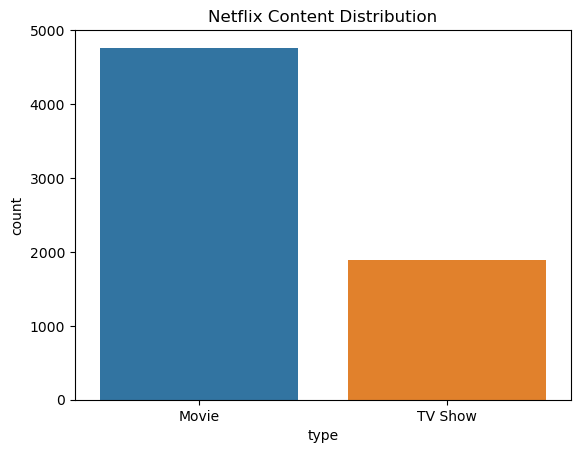

In [57]:
# Chart - 1 visualization code
sns.barplot(x='type',y='count',data=content_type,hue='type')
plt.title("Netflix Content Distribution")
plt.show()

##### 1. Why did you pick the specific chart?

Bar-charts are easier for comparative analysis among categories.

##### 2. What is/are the insight(s) found from the chart?

* From this chart, it is clear that the Movies are **more in number** than the TV Shows

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

If we could increase the number of TV Shows on the platform, it would be beneficial for the business by increasing customer engagement and satisfaction scores.

#### Chart - 2

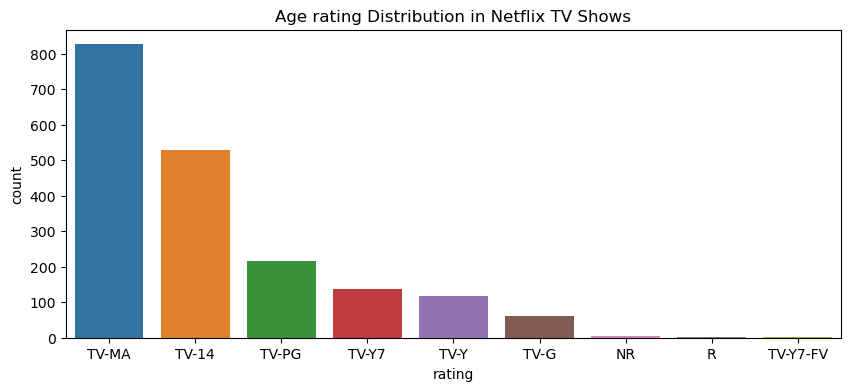

In [58]:
# Chart - 2 visualization code
plt.figure(figsize=(10,4))
sns.barplot(x='rating',y='count',data=tv_age,hue='rating')
plt.title("Age rating Distribution in Netflix TV Shows")
plt.show()

##### 1. Why did you pick the specific chart?

Bar-charts are easier for comparative analysis among categories.

##### 2. What is/are the insight(s) found from the chart?

Majority of the TV Shows are  'TV-MA' rated on netflix, indicating targeting Adult individuals, followed by 'TV-14'.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

By focusing on increasing content on other ratings, we could serve all types of audiences which would increase the engagement and satisfaction of customers.

#### Chart - 3

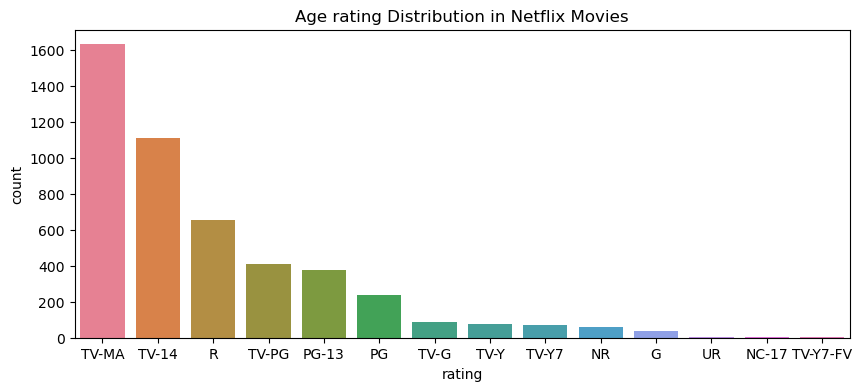

In [59]:
# Chart - 3 visualization code
plt.figure(figsize=(10,4))
sns.barplot(x='rating',y='count',data=movie_age,hue='rating')
plt.title("Age rating Distribution in Netflix Movies")
plt.show()

##### 1. Why did you pick the specific chart?

Bar-charts are easier for comparative analysis among categories.

##### 2. What is/are the insight(s) found from the chart?

Majority of Movies are 'TV-MA' followed by 'TV-14' , 'R' and 'TV-PG'. these are more diversified than TV-Shows in which only some categories are present.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

Movies are more diversified than TV-Shows, These already cater to different sections of audiences.

#### Chart - 4

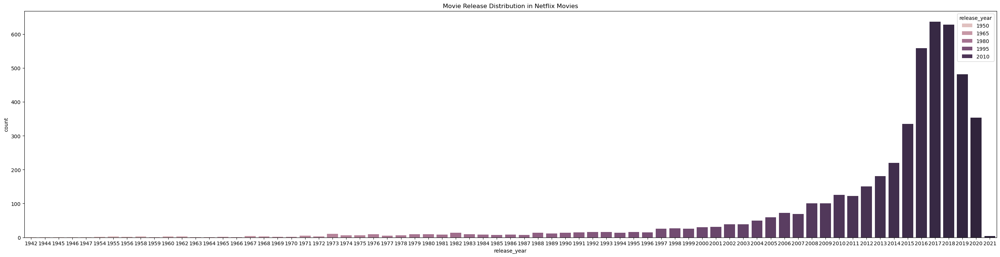

In [60]:
# Chart - 4 visualization code
plt.figure(figsize=(34,8))
sns.barplot(x='release_year',y='count',data=movies_years,hue='release_year')
plt.title("Movie Release Distribution in Netflix Movies")
plt.show()

##### 1. Why did you pick the specific chart?

Bar-charts are easier for comparative analysis among different categories.

##### 2. What is/are the insight(s) found from the chart?

From this graph it is clear that the number of movies released are gradually increasing from 1997 to 2014.
After 2014 there is a drastic increase in number of movies and the peak is around 2017 & 2018 and there is decline.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

By investigating the reason for decline for movies after 2018, and acquiring top- rated latest movies can lead to better positive impact.

#### Chart - 5

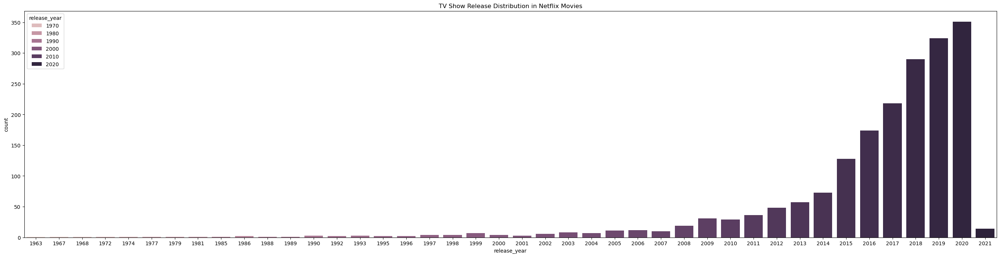

In [61]:
# Chart - 5 visualization code
plt.figure(figsize=(34,8))
sns.barplot(x='release_year',y='count',data=tv_years,hue='release_year')
plt.title("TV Show Release Distribution in Netflix Movies")
plt.show()

##### 1. Why did you pick the specific chart?

Bar-charts are easier for comparative analysis among different categories.

##### 2. What is/are the insight(s) found from the chart?

* Majority of the TV Shows are  'TV-MA' rated on netflix, indicating targeting Adult individuals, followed by 'TV-14'.\
* The are is gradual increase in TV shows from 2010 with peak ar 2020.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

By acquiring top rated tv shows and producing them, we can increase customer satisfacion scores.

#### Chart - 6

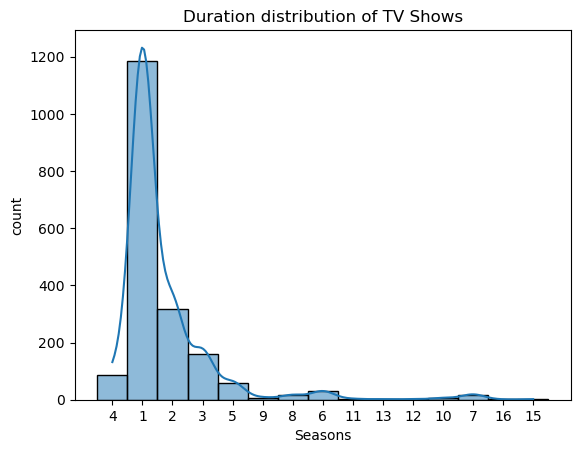

In [62]:
# Chart - 6 visualization code
sns.histplot(tv_shows['duration'],kde=True)
plt.title("Duration distribution of TV Shows")
plt.ylabel("count")
plt.xlabel("Seasons")
plt.show()

##### 1. Why did you pick the specific chart?

Histograms are better to visualize the distribution of a single feature.

##### 2. What is/are the insight(s) found from the chart?

From this chart, it is evident that most of the TV Shows are 1 season long indicating limited series and very few are more than 5 seasons.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

By producing better content writing , we can extend to multiple seasons resulting customer engagement, and also acquire limited series to cater audiences who dont spend much of their time on viewing.

#### Chart - 7

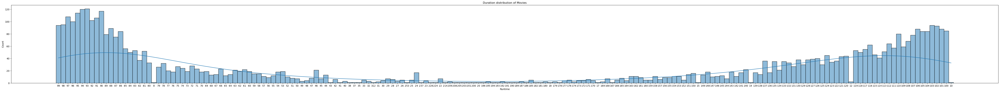

In [63]:
# Chart - 7 visualization code
plt.figure(figsize=(75,6))
sns.histplot(movies['duration'].sort_values(ascending=False),kde=True)
plt.title("Duration distribution of Movies")
plt.ylabel("Count")
plt.xlabel("Runtime")
plt.show()

##### 1. Why did you pick the specific chart?

Histograms are better to visualize the distribution of a single feature.

##### 2. What is/are the insight(s) found from the chart?

Most of the Movies are 1.5 hr long or 3 hrs long, which is also general prefered runtime of the audiences based on the content in movie.

#### Chart - 8

In [64]:
tv_country=tv_country[tv_country['counts']>tv_country['counts'].mean()]

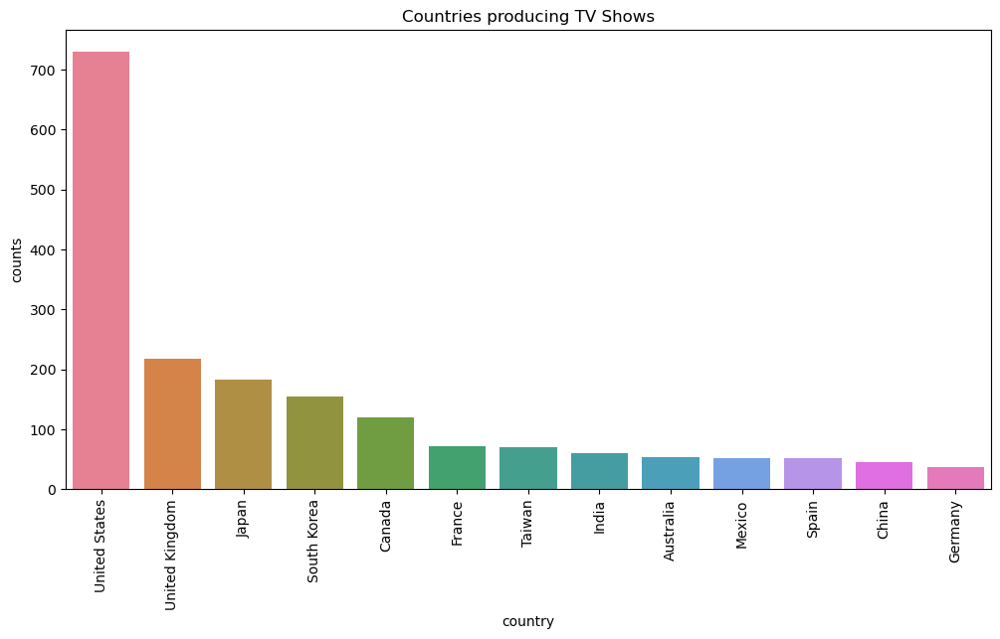

In [65]:
# Chart - 8 visualization code
plt.figure(figsize=(12,6))
sns.barplot(x='country',y='counts',hue='country',data=tv_country)
plt.title("Countries producing TV Shows")
plt.xticks(rotation=90)
plt.show()

##### 1. Why did you pick the specific chart?

Bar-charts are easier for comparative analysis among different categories.

##### 2. What is/are the insight(s) found from the chart?

US dominates in producing more number of TV Shows than other countires followed by UK, Japan.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

By acquiring more number of TV Shows from other countires, it would be encouraging for them to produce more content from their country.

#### Chart - 9

In [66]:
movie_country=movie_country[movie_country['counts']>movie_country['counts'].mean()]

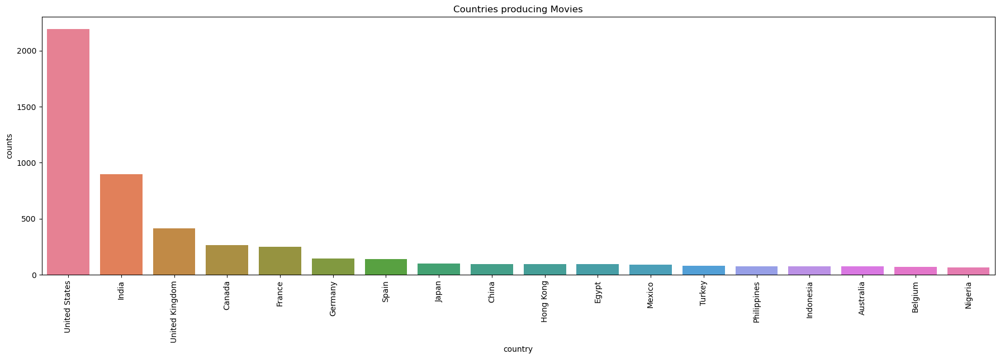

In [67]:
# Chart - 9 visualization code
plt.figure(figsize=(22,6))
sns.barplot(x='country',y='counts',hue='country',data=movie_country)
plt.title("Countries producing Movies")
plt.xticks(rotation=90)
plt.show()

##### 1. Why did you pick the specific chart?

Bar-charts are easier for comparative analysis among different categories.

##### 2. What is/are the insight(s) found from the chart?

US, again dominates in producing Movies, followed by India and UK.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

By acquiring more number of Movies from other countires, it would be encouraging for them to produce more content from their country.

#### Chart - 10

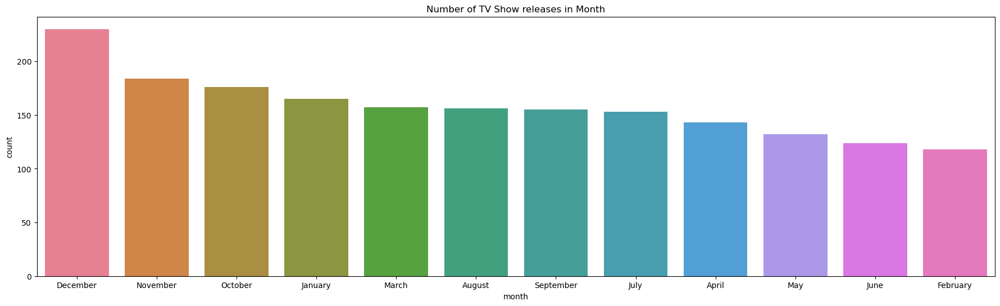

In [68]:
# Chart - 10 visualization code
plt.figure(figsize=(22,6))
sns.barplot(x='month',y='count',hue='month',data=tv_month)
plt.title("Number of TV Show releases in Month")
plt.show()

##### 1. Why did you pick the specific chart?

Bar-charts are effective for doing comparative-analysis among the categories.

##### 2. What is/are the insight(s) found from the chart?

December has most of the releases, indicating festival holidays, winter holidays in foreign countires. followed by November, October.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

By increasing the releases in other months too will provide customers with adequate watchlist, so that they won't be leaving in the middle of the year.

#### Chart - 11

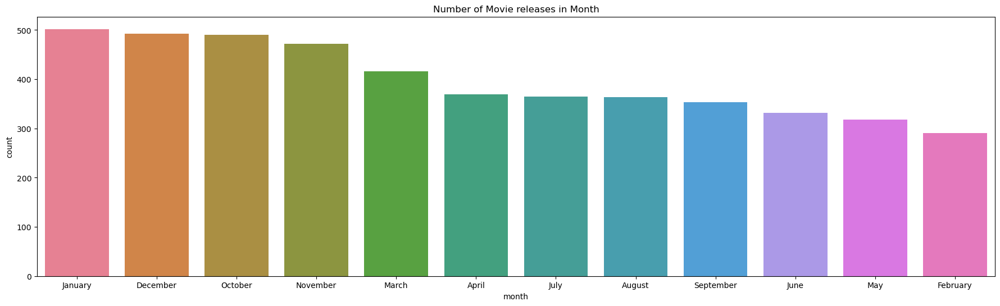

In [69]:
# Chart - 11 visualization code
plt.figure(figsize=(22,6))
sns.barplot(x='month',y='count',hue='month',data=movie_month)
plt.title("Number of Movie releases in Month")
plt.show()


##### 1. Why did you pick the specific chart?

Bar-charts are effective for doing comparative-analysis among the categories.

##### 2. What is/are the insight(s) found from the chart?

Comparing to TV Shows , The number of movie releases are more and consistent through out the year, which increases customer satisfaction.

#### Chart - 12

In [70]:
tv_country_genre_counts

,country,listed_in,count
0,Australia,International TV Shows,1
1,Australia,Kids' TV,1
2,Australia,Romantic TV Shows,1
3,Australia,TV Comedies,1
4,Australia,TV Dramas,1
...,...,...,...
727,United States,TV Action & Adventure,32
728,United States,TV Comedies,100
729,United States,TV Dramas,52
730,United States,TV Horror,9


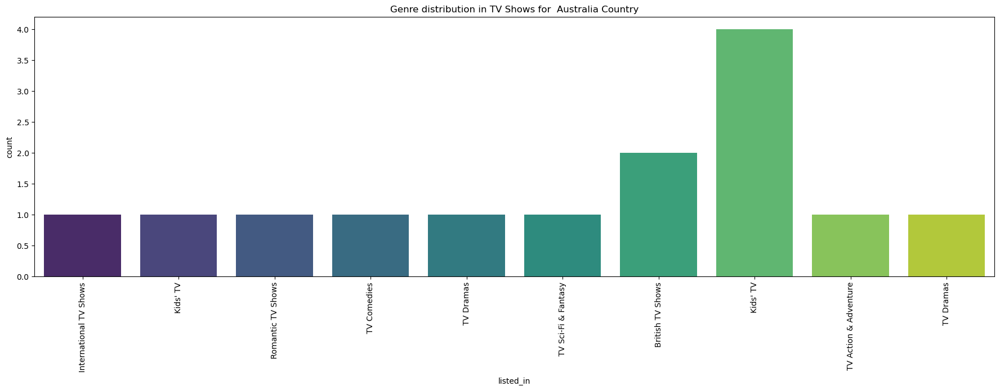

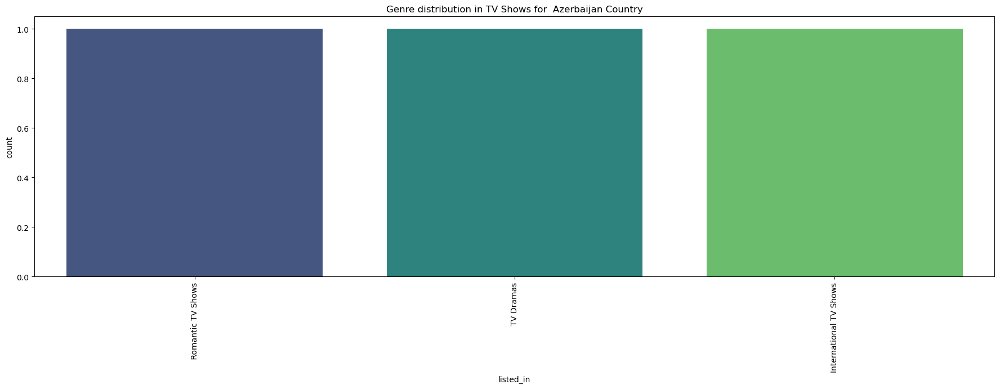

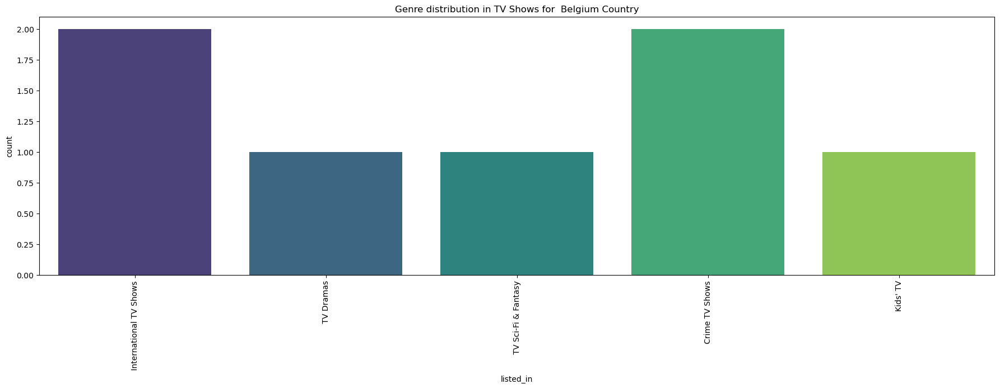

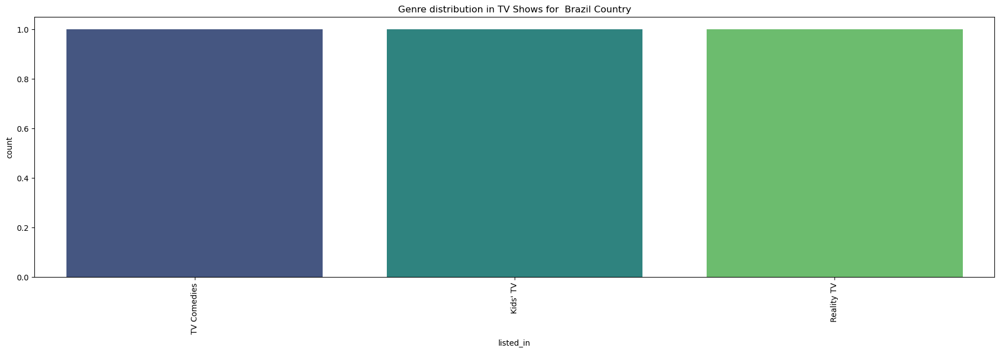

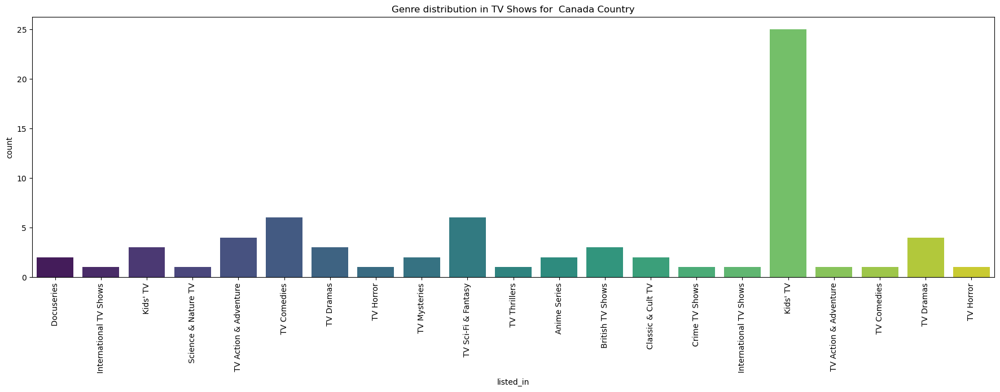

...

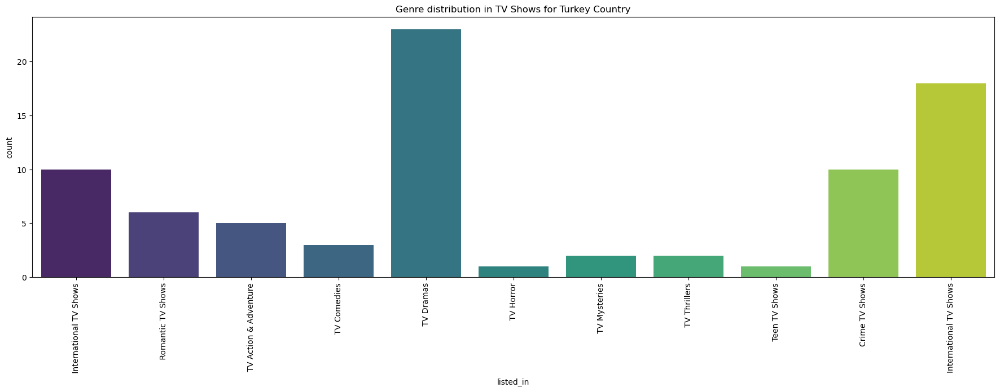

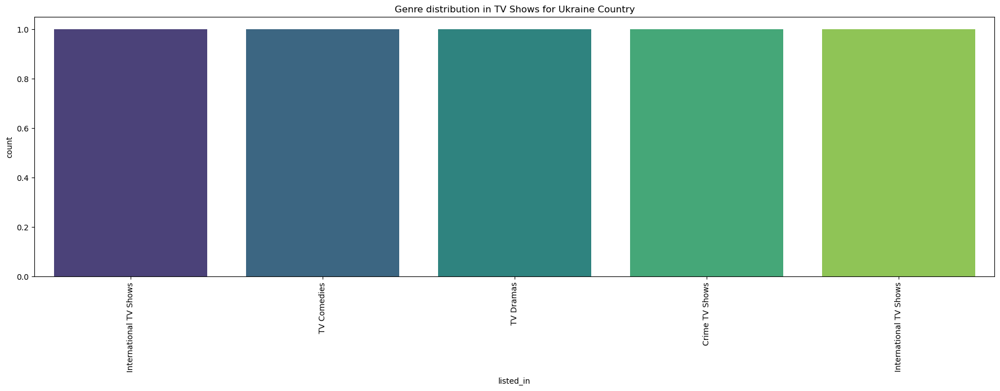

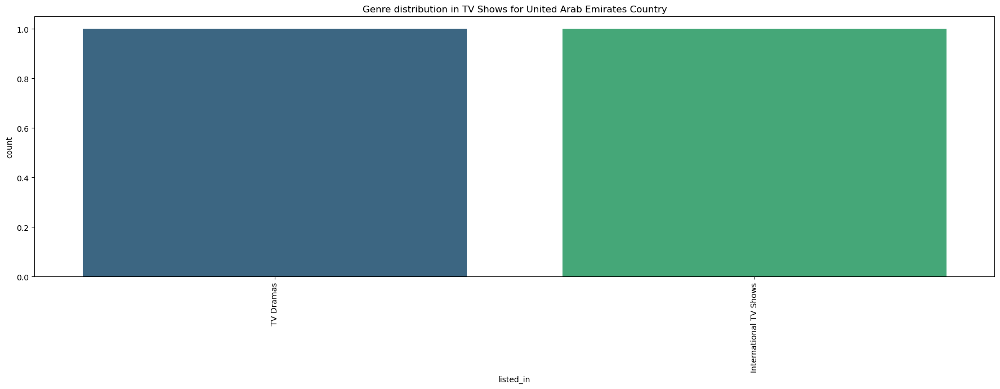

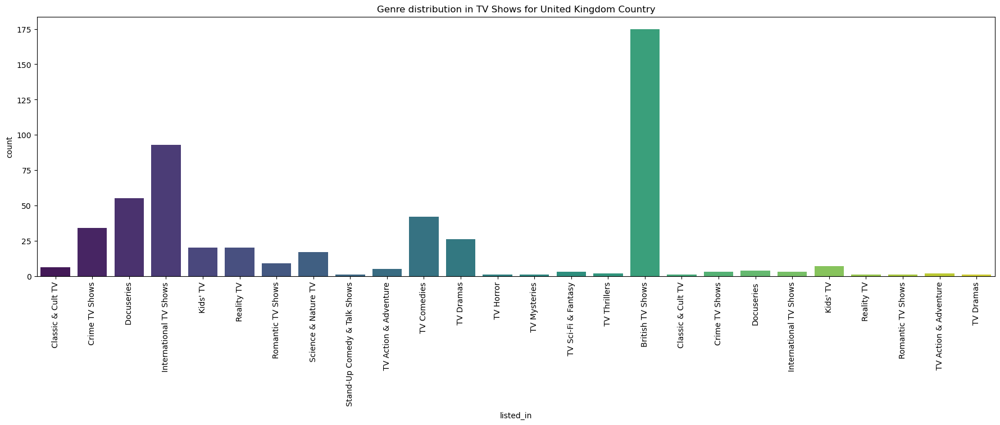

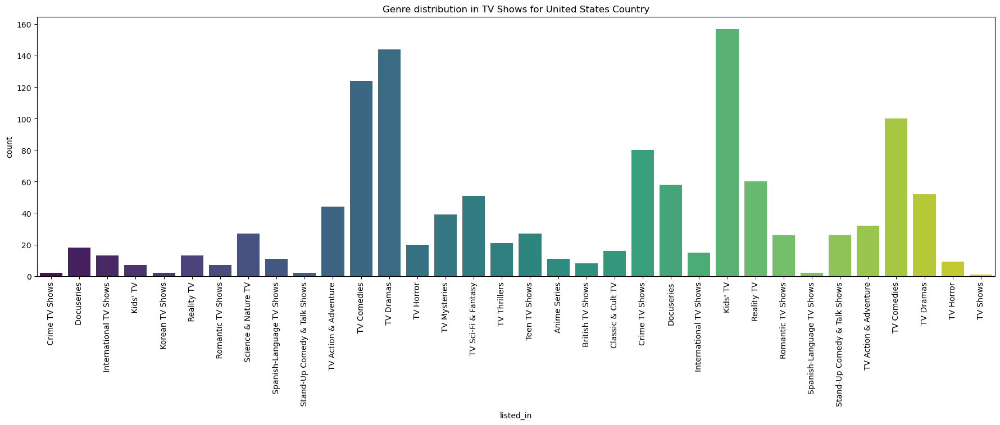

In [80]:
# Chart - 12 visualization code
for x in tv_country_genre_counts['country'].unique():
    temp_df=tv_country_genre_counts[tv_country_genre_counts['country']==x][['listed_in','count']]
    plt.figure(figsize=(22,6))
    sns.barplot(x='listed_in',y='count',data=temp_df,palette='viridis',hue='listed_in')
    plt.title(f"Genre distribution in TV Shows for {x} Country")
    plt.xticks(rotation=90)
    plt.show()

##### 1. Why did you pick the specific chart?

Bar-charts are effective for doing comparative-analysis among the categories.

##### 2. What is/are the insight(s) found from the chart?

Based on these charts , we can get insights into the viewing preferences for TV Shows are considered from those countries and improve the services

#### Chart - 13

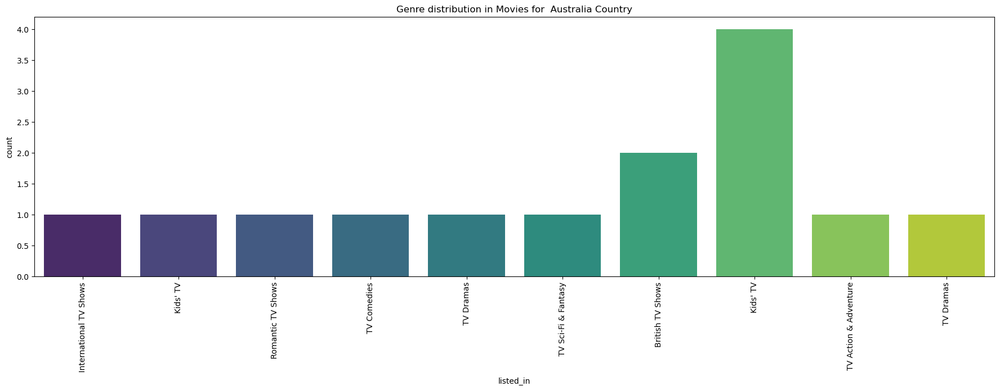

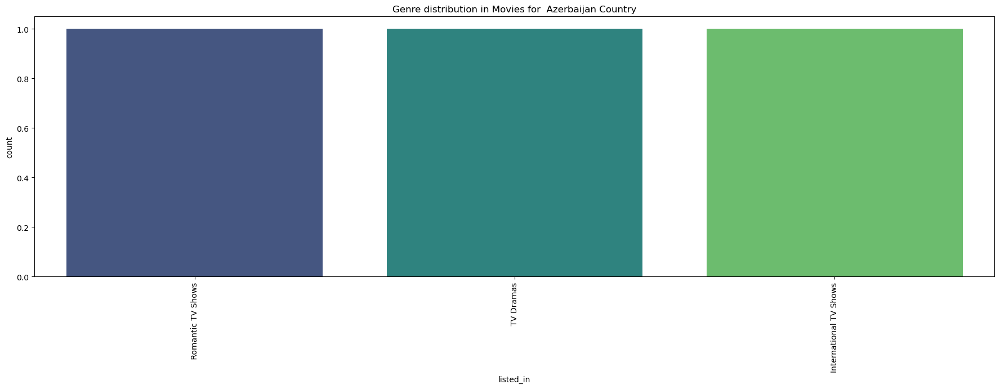

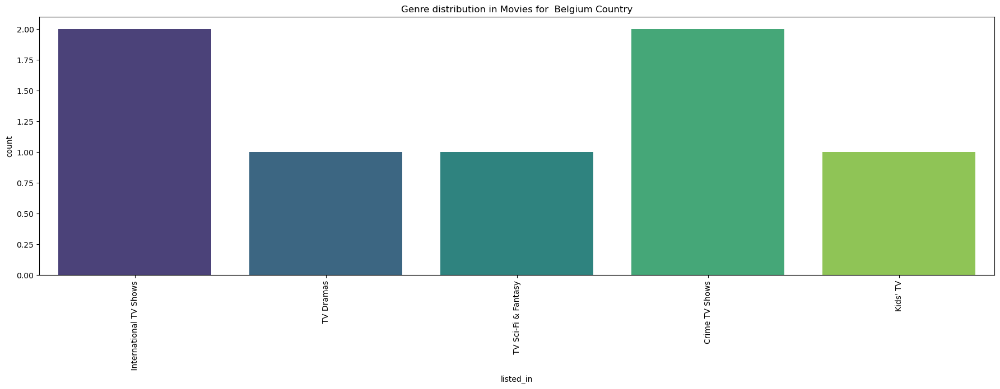

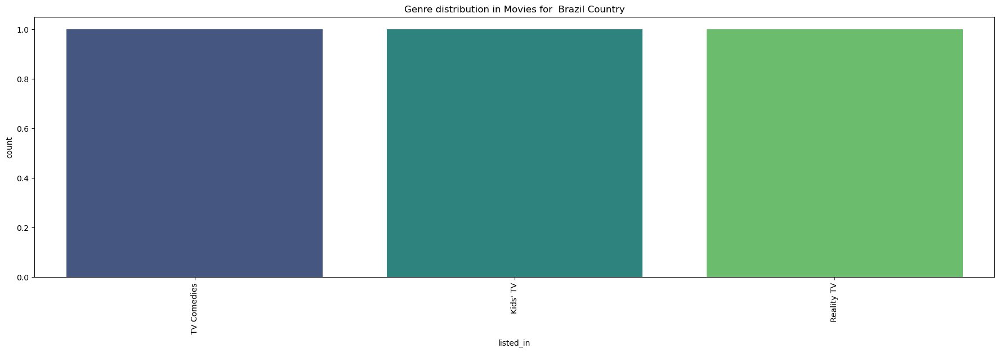

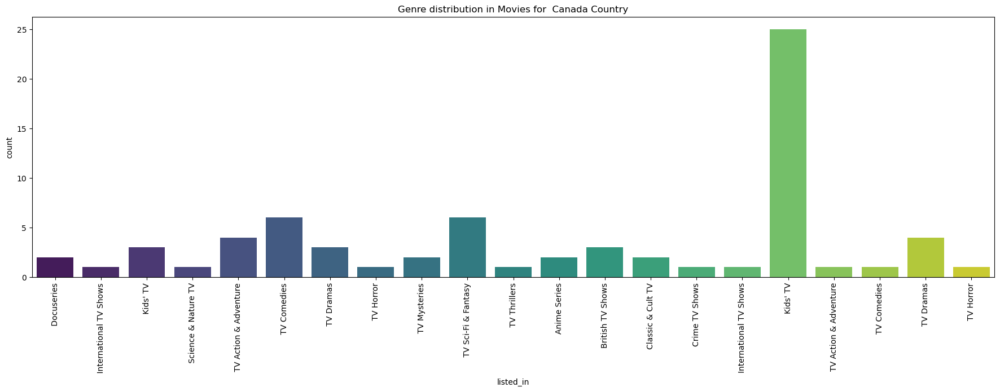

...

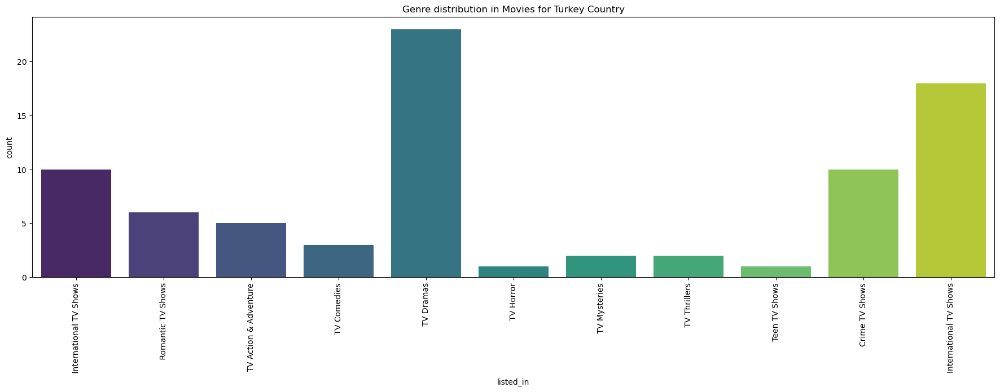

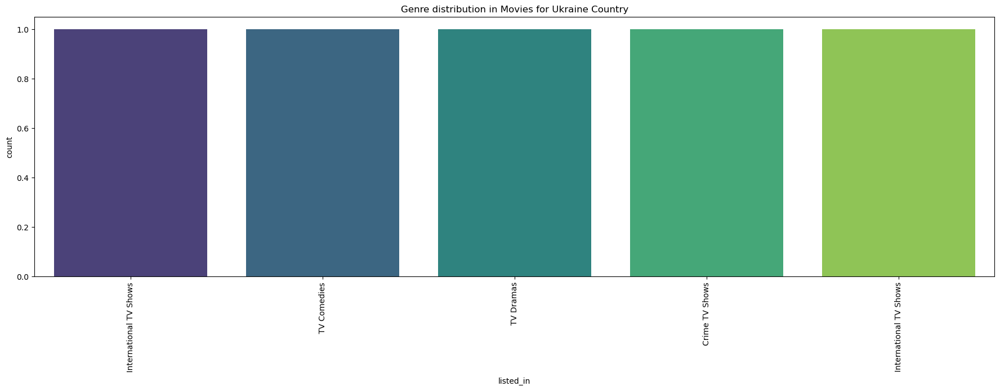

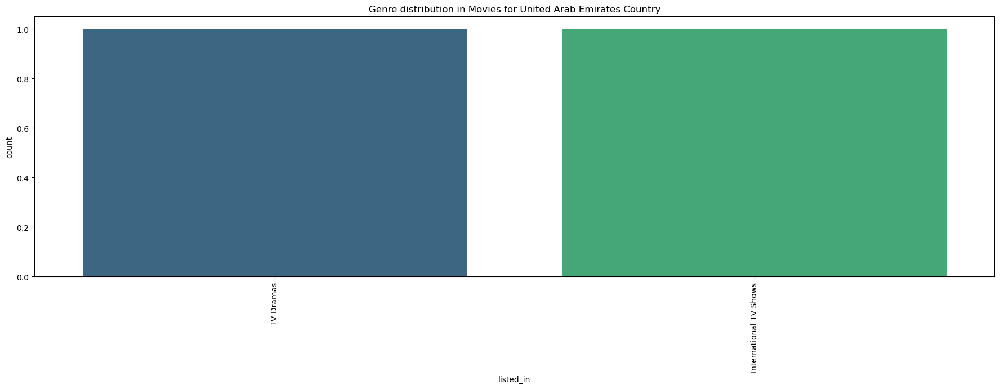

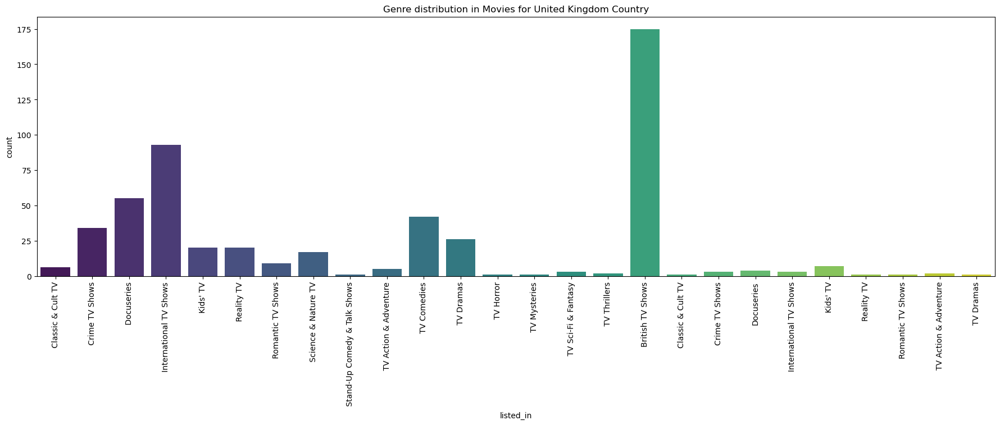

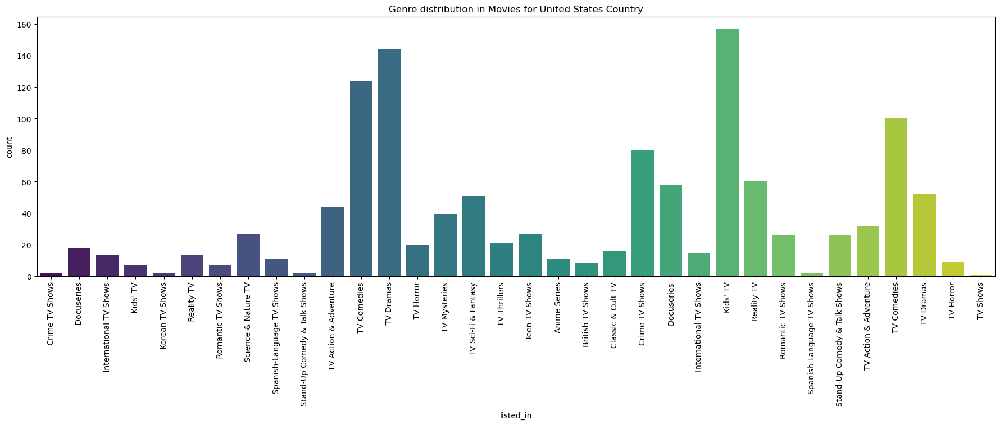

In [81]:
# Chart - 13 visualization code
for x in movie_country_genre_counts['country'].unique():
    temp_df=movie_country_genre_counts[movie_country_genre_counts['country']==x][['listed_in','count']]
    plt.figure(figsize=(22,6))
    sns.barplot(x='listed_in',y='count',data=temp_df,palette='viridis',hue='listed_in')
    plt.title(f"Genre distribution in Movies for {x} Country")
    plt.xticks(rotation=90)
    plt.show()

##### 1. Why did you pick the specific chart?

Bar-charts are effective for doing comparative-analysis among the categories.

##### 2. What is/are the insight(s) found from the chart?

Based on these charts , we can get insights into the viewing preferences for Movies are considered from those countries and improve the services

#### Chart-14

In [73]:
tv_genres

,genre,counts
0,International TV Shows,971
1,TV Dramas,619
2,TV Comedies,457
3,Crime TV Shows,340
4,Kids' TV,319
5,Romantic TV Shows,278
6,British TV Shows,185
7,Docuseries,159
8,TV Action & Adventure,140
9,Anime Series,136


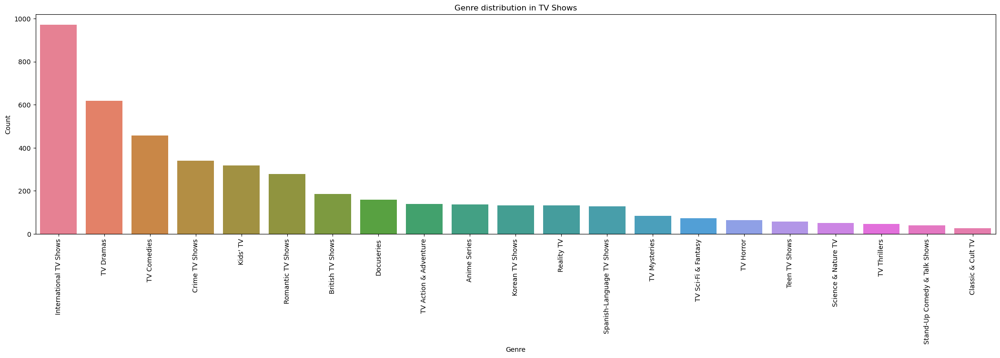

In [74]:
# Chart - 14 visualization code
plt.figure(figsize=(26,6))
sns.barplot(x='genre',y='counts',hue='genre',data=tv_genres)
plt.title("Genre distribution in TV Shows")
plt.xlabel("Genre")
plt.ylabel("Count")
plt.xticks(rotation=90)
plt.show()

##### 1. Why did you pick the specific chart?

Bar-charts are effective for comparative analysis among categories.

##### 2. What is/are the insight(s) found from the chart?

International TV shows are present majorily on netflix followed by Drams, Crimes.
Least are Horror, Teen, Thriller genres.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

By increasing Horror, Teen, Thriller genres we can acquire audience who loves to see those genres.

#### Chart - 15

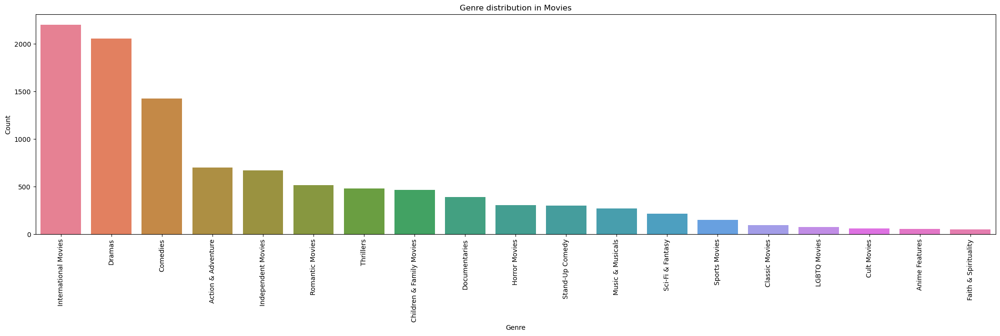

In [75]:
# Chart - 15 visualization code
plt.figure(figsize=(26,6))
sns.barplot(x='genre',y='counts',hue='genre',data=movie_genres)
plt.title("Genre distribution in Movies")
plt.xlabel("Genre")
plt.ylabel("Count")
plt.xticks(rotation=90)
plt.show()

##### 1. Why did you pick the specific chart?

Bar-charts are effective for comparative analysis among categories.

##### 2. What is/are the insight(s) found from the chart?

Most of the movies belong to international, drams and comedies.
Least favorites are LGBTQ movies, Cult, Anime and Sprituality movies.

#### Chart - 16 - Correlation Heatmap

In [76]:
df.head()

,type,title,director,cast,country,release_year,rating,duration,listed_in,month
0,TV Show,3%,"Raúl Campos, Jan Suter","João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",August
1,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,2016,TV-MA,93 min,"Dramas, International Movies",December
2,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,2011,R,78 min,"Horror Movies, International Movies",December
3,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...",November
4,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,2008,PG-13,123 min,Dramas,January


In [77]:
le = LabelEncoder()
df_encoded = df.copy()

for column in df_encoded.select_dtypes(include='object').columns:
    df_encoded[column] = le.fit_transform(df_encoded[column].astype(str))

corr = df_encoded.corr()

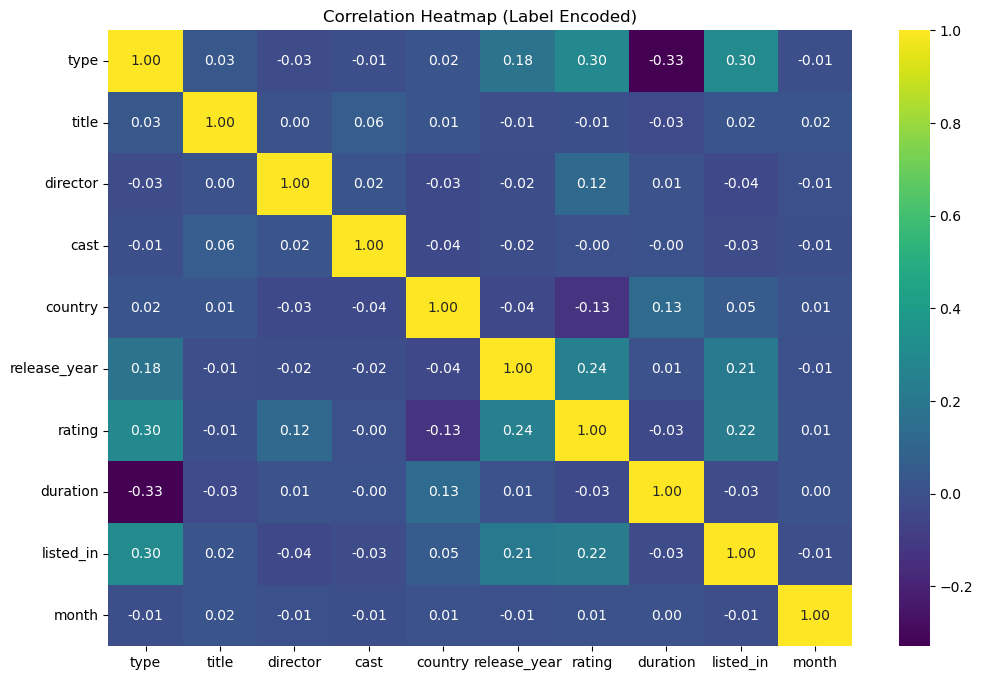

In [78]:
# Correlation Heatmap visualization code
plt.figure(figsize=(12, 8))
sns.heatmap(corr, annot=True, cmap='viridis', fmt=".2f")
plt.title("Correlation Heatmap (Label Encoded)")
plt.show()

##### 1. Why did you pick the specific chart?

Correlation Heatmap is useful to find the correlation between 2 variables.

##### 2. What is/are the insight(s) found from the chart?

1. Weak Correlation Across Most Variables.\
2. Notable Moderate Correlations
    * **type & rating: +0.30**\
    * **type & listed_in: +0.30**\
    * **type & duration: -0.33**\
    * **release_year & rating: +0.24**\
    * **release_year & listed_in: +0.21**\
    * **rating & listed_in: +0.22**\
3.  No Strong Correlation


#### Chart - 17 - Pair Plot

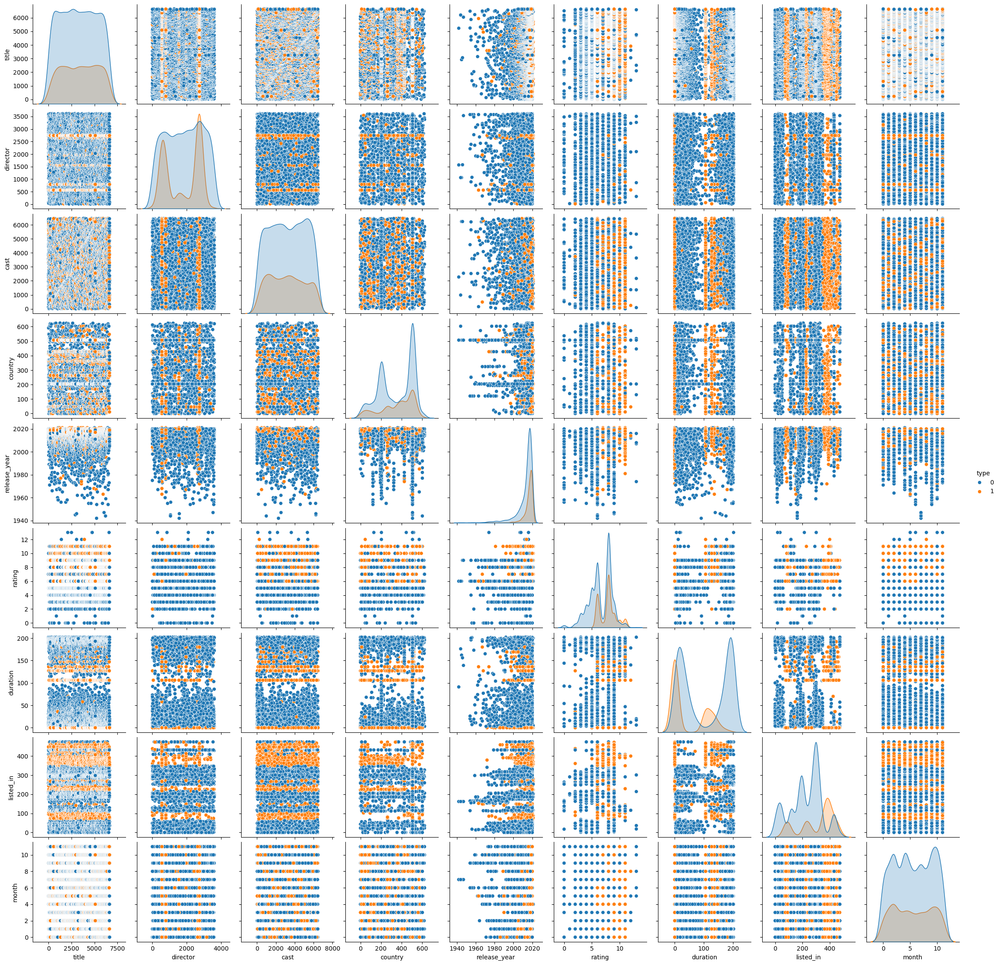

In [79]:
# Pair Plot visualization code
sns.pairplot(df_encoded,hue='type')
plt.show()

##### 1. Why did you pick the specific chart?

The pair plot shows scatter plots, KDE/histograms, and color-coded types (0 = blue, 1 = orange) across all pairs of variables, offering a deeper understanding of patterns beyond linear correlations.

## **5. Solution to Business Objective**

#### What do you suggest the client to achieve Business Objective ?
Explain Briefly.

**1. Overtime both TV Shows and Movies have increased in number on the platform.**\
**2. Movies are more in number compared to TV Shows but there is slight decline in number of movies and increase in TV Shows.**

# **Conclusion**

* **Giving preference to both TV Shows, Movies with differnt genres catering to different section of audiences will provide diversity on the platform and increases user engagement.**
* **Improved Recommendation engine will make the content visible to customers to enjoy differnt type of Movies and TV shows**

### ***Hurrah! You have successfully completed your EDA Capstone Project !!!***